In [145]:
import json

from pymongo import MongoClient

import numpy as np
import matplotlib.pyplot as plt
#import line_profiler

from helpers import *
from imputation import *

from bokeh.io import output_notebook, push_notebook
from bokeh.plotting import figure, show
from bokeh.layouts import column
from bokeh.models import *

from ipywidgets.widgets import Button, HBox
from IPython.display import display

import matplotlib.pyplot
%matplotlib inline
import pandas as pd

from imputation import fill_gaps

client = MongoClient("localhost", 27017)
db = client['usgs']
output_notebook()
%load_ext Cython

Loading BokehJS ...

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [146]:
sid = json.load(open('revision_list_v.json'))['to_review']

In [261]:
si = 39
print(sid[si])

Tm, Zm, Tc, Zc = get_data(db, sid[si])
Zm = feet_to_meters(Zm)
Zc = feet_to_meters(Zc)

dt, Ym, Yc = align_measurements(Tm, Zm, Tc, Zc)
print(Ym.size, Yc.size, dt)

5394500
130026 130026 900


In [262]:
flag = 0
if flag == 1:
    Yc = fill_gaps(Yc, 864400//dt*7)
    Ym = fill_gaps(Ym, 864400//dt*7)

In [263]:
nplot = 50
interval = np.array(range(0, Ym.size, round(Ym.size/nplot)))
print(interval)
print(interval.size)

[     0   2601   5202   7803  10404  13005  15606  18207  20808  23409
  26010  28611  31212  33813  36414  39015  41616  44217  46818  49419
  52020  54621  57222  59823  62424  65025  67626  70227  72828  75429
  78030  80631  83232  85833  88434  91035  93636  96237  98838 101439
 104040 106641 109242 111843 114444 117045 119646 122247 124848 127449]
50


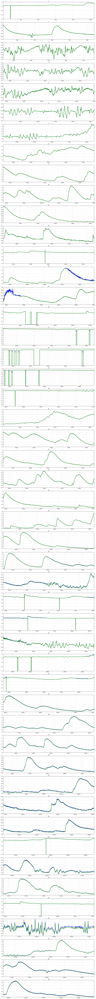

In [298]:
matplotlib.rcParams['figure.figsize'] = (18.0, 200.0)
for i in range(1, nplot):
    plt.subplot(nplot,1,i)
    plt.plot(np.arange(interval[i-1], interval[i]),
        Ym[interval[i-1]:interval[i],], color="blue", linewidth=1.8, linestyle="-")
    
    plt.plot(np.arange(interval[i-1], interval[i]),
             Yc[interval[i-1]:interval[i],], color="green", linewidth=2.5, linestyle="-")
    
    plt.title(i)
    plt.xlim(interval[i-1], interval[i])
    plt.grid()

(33813, 36414)

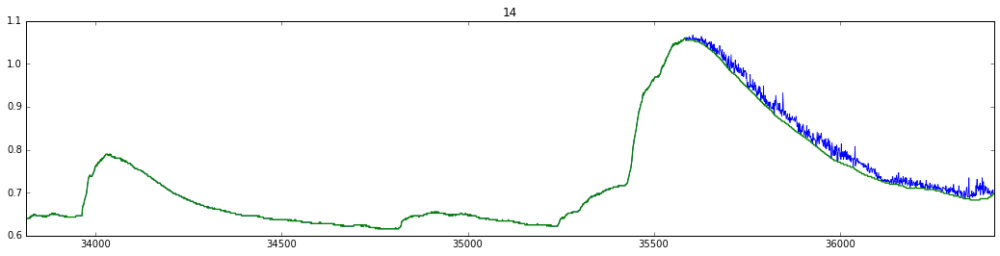

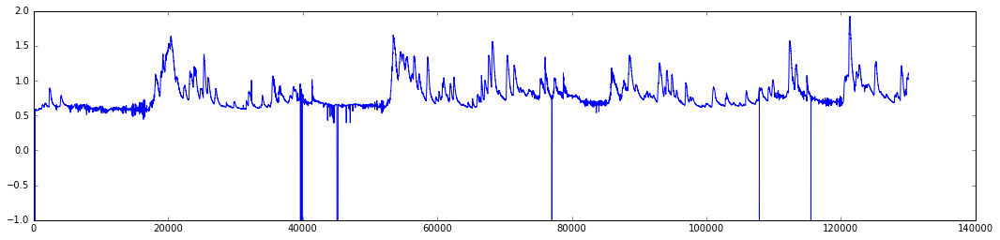

In [300]:
matplotlib.rcParams['figure.figsize'] = (18.0, 4.0)

plt.plot(Ym)
plt.show()

In [301]:
ts = pd.Series(Ym, index = range(Ym.size))

In [339]:
cumvar = np.empty([1, 1])
for i in range(1, Ym.size):
        cumvar = np.append(cumvar, np.var(Ym[:i]))


In [328]:
wstd = ts.expanding(min_periods=1).var()
#wstd = ts.rolling(window=500, win_type='triang').mean()

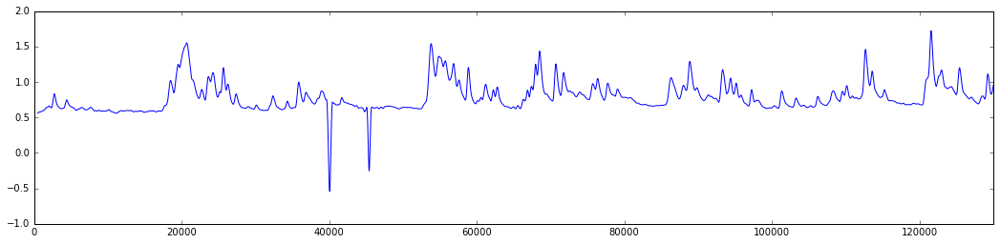

In [336]:
wstd.plot()

(33813, 36414)

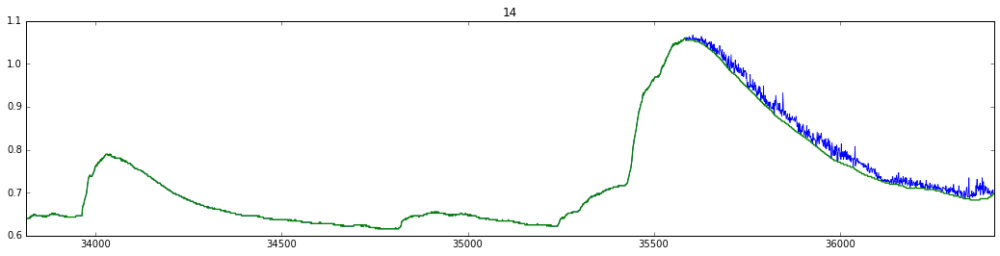

In [337]:
whichprint = 14
matplotlib.rcParams['figure.figsize'] = (18.0, 4.0)
plt.plot(np.arange(interval[whichprint-1], interval[whichprint]),
         Ym[interval[whichprint-1]:interval[whichprint],], color="blue", linewidth=0.8, linestyle="-")

plt.plot(np.arange(interval[whichprint-1], interval[whichprint]), 
         Yc[interval[whichprint-1]:interval[whichprint],], color="green", linewidth=1.3, linestyle="-")
plt.title(whichprint)

plt.xlim(interval[whichprint-1], interval[whichprint])

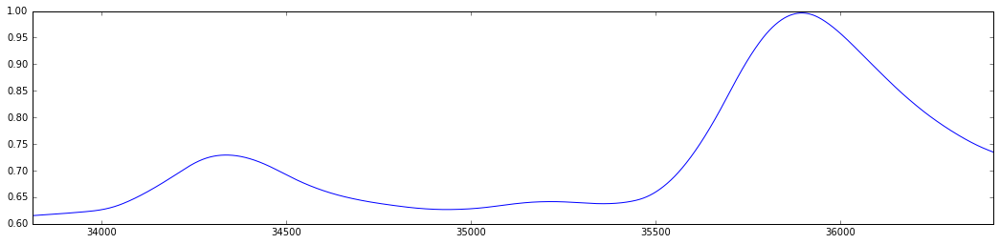

In [338]:
wstd[interval[whichprint-1]:interval[whichprint],].plot()

In [334]:
Ym[Ym <= 0] = -1
Yc[Yc <= 0] = -1

Ym = fill_gaps(Ym, max_gap = 4, spike_size = 2, window_size = 10)
Yc = fill_gaps(Yc, max_gap = 4, spike_size = 2, window_size = 10)

y_true = mark_anomaly(Ym, Yc, 0.02)

Ym[Ym <= 0] = np.nan
Yc[Yc <= 0] = np.nan

n = 1000
k = 50
i = k
count = 0
idx = list()   

weighted_var = np.empty([1, 1])
for i in range(1, Ym.size):
        weighted_var = np.append(weighted_var, np.var(Ym[:i]))
        
        
source = ColumnDataSource(
    data = dict(
        x  = np.arange(Ym.size) * dt / 3600, 
        m  = Ym, 
        c  = Yc, 
        a  = y_true,
        wvar = weighted_var
    )
)


source2 = ColumnDataSource(
    data = dict(
        x  = np.arange(Ym.size-1) * dt / 3600, 
        diff =  Ym[1:] - Ym[:-1]
    )
)



gh_tools = [BoxZoomTool(), WheelZoomTool(dimensions=['width']), WheelZoomTool(dimensions=['height']), PanTool(), 
            SaveTool()]

gh_plot = figure(title = 'Site %i' % sid[si], 
                 plot_height = 300, 
                 plot_width = 950, 
                 tools = gh_tools, 
                 toolbar_location = "above", 
                 x_axis_label = "Time, hours",
                 y_axis_label = "Gage Height, meters",
                 y_range = (-1, Zc.max()))

anomaly_plot = figure(title = 'Site %i. Is Anomaly' % sid[si], plot_height = 200, plot_width = 950, y_range = (-0.5,1.5), 
                      x_range = gh_plot.x_range, toolbar_location = "above")


wvar_plot = figure(plot_height = 300, 
                 plot_width = 950)

diff_plot = figure(plot_height = 300, 
                   plot_width = 950)

gh_plot.line("x", "m",  source = source, color = '#ff0000', line_width = 2, legend="GH Measured")
gh_plot.line("x", "c",  source = source, color = '#0000ff', line_width = 2, legend="GH Computed")

gh_plot.ygrid.minor_grid_line_color = 'navy'
gh_plot.ygrid.minor_grid_line_alpha = 0.1

gh_plot.xgrid.minor_grid_line_color = 'navy'
gh_plot.xgrid.minor_grid_line_alpha = 0.1

anomaly_plot.line("x", "a", source = source, color = '#000000', line_width = 2)

wvar_plot.line("x", "wvar", source = source, color = '#ff0000', line_width = 2, legend="GH Measured")

diff_plot.line("x", "diff",  source = source2, color = '#ff0000', line_width = 2, legend="GH Measured")

show(column(gh_plot, anomaly_plot, wvar_plot, diff_plot))

/home/vmachine/anaconda3/lib/python3.5/site-packages/bokeh/plotting/helpers.py:322: UserWarning: WheelZoomTool are being repeated
  warnings.warn("%s are being repeated" % ",".join(repeated_tools))


In [5]:
si = 0
print(sid[si])

Tm, Zm, Tc, Zc = get_data(db, sid[si])
Zm = feet_to_meters(Zm)
Zc = feet_to_meters(Zc)

dt, Ym, Yc = align_measurements(Tm, Zm, Tc, Zc)

Ym[Ym <= 0] = -1
Yc[Yc <= 0] = -1

Ym = fill_gaps(Ym, max_gap = 15, spike_size = 2, window_size = 10)
Yc = fill_gaps(Yc, max_gap = 15, spike_size = 2, window_size = 10)

8405500
